Running scvelo 0.2.4 (python 3.9.7) on 2022-04-29 22:12.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI's XMLRPC API is currently disabled due to unmanageable load and will be deprecated in the near future. See https://status.python.org/ for more information.


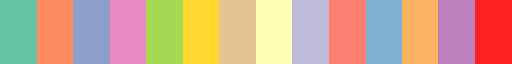

In [1]:
# -*- coding: utf-8 -*-
"""
Created on Fri Mar 27 08:34:49 2020
https://scvelo.readthedocs.io/
@author: Administrator
"""
import scvelo as scv
import scanpy as sc
import numpy as np
import matplotlib
# matplotlib.rcParams['image.cmap'] = 'RdBu_r' #default
scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.set_figure_params('scvelo')  # for beautified visualization
scv.settings.set_figure_params('scvelo')

# in R
colorlist = ["#66C2A5", "#FC8D62", "#8DA0CB","#E78AC3","#A6D854", "#FFD92F", "#E5C494", "#FFFFB3", "#BEBADA", "#FB8072","#80B1D3" ,"#FDB462", "#BC80BD","#ff2121"]

matplotlib.colors.ListedColormap(colorlist, name='colorlist')
# matplotlib.rcParams["axes.prop_cycle"] = colorlist

# 从seurat载入anndata对象

In [4]:
adata=sc.read('./dataset1_velo.h5ad')

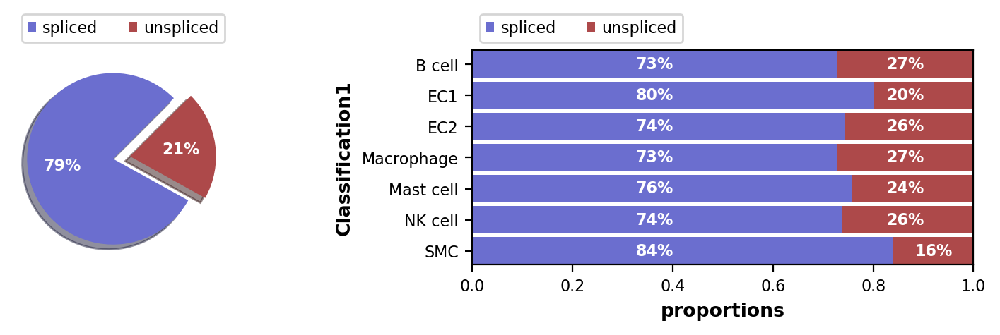

In [5]:
scv.pl.proportions(adata, groupby='Classification1')

Normalized count data: X, spliced, unspliced.
Extracted 4000 highly variable genes.
Logarithmized X.


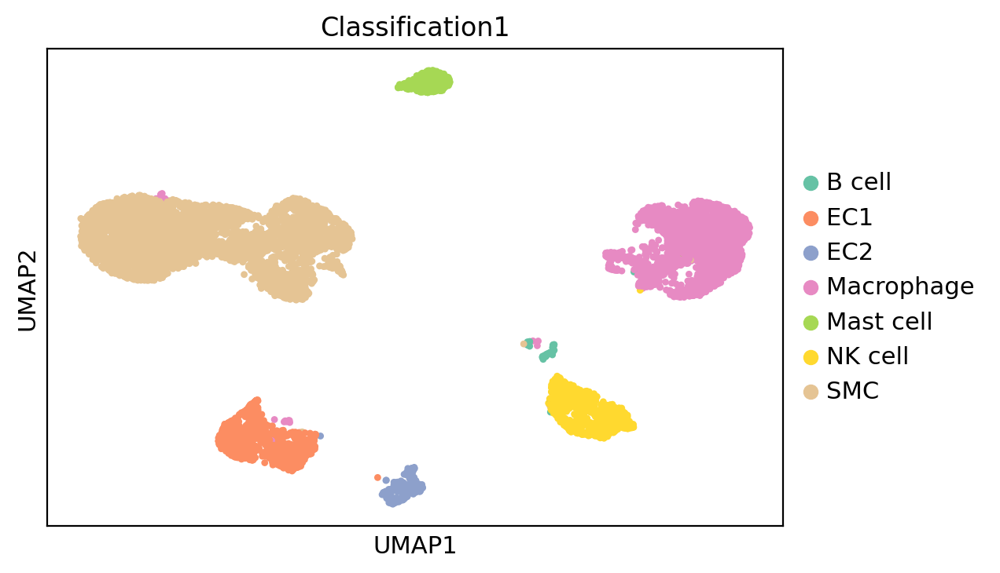

computing neighbors
    finished (0:00:09) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [6]:
scv.pp.filter_and_normalize(adata, n_top_genes=4000)
sc.pl.umap(adata, color=['Classification1'], size=40, palette = colorlist)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
scv.tl.velocity(adata)

In [7]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/8 cores)


  0%|          | 0/8693 [00:00<?, ?cells/s]

    finished (0:00:42) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


<AxesSubplot:title={'center':'Classification1'}>

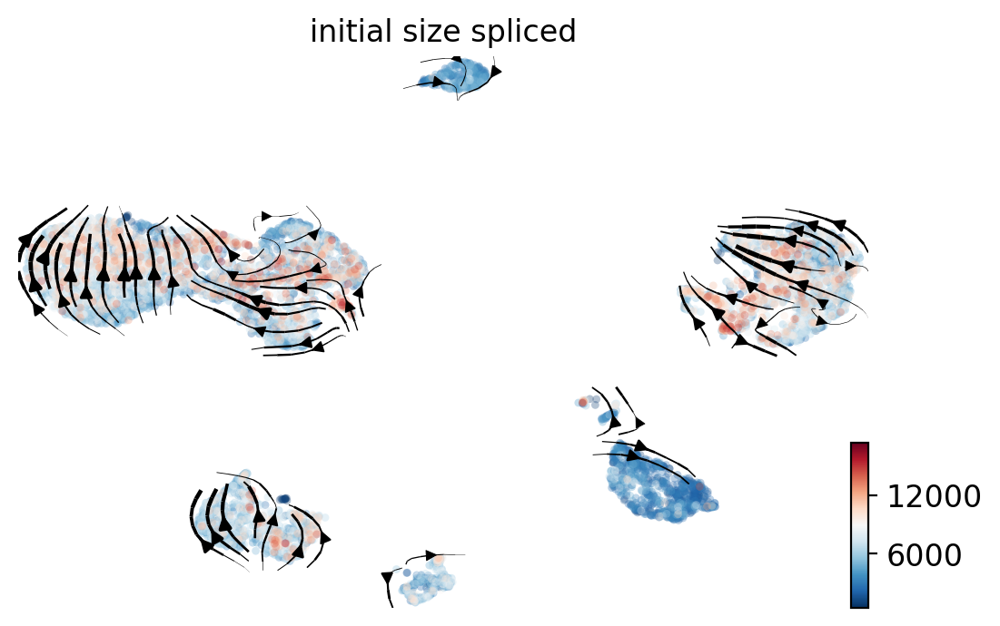

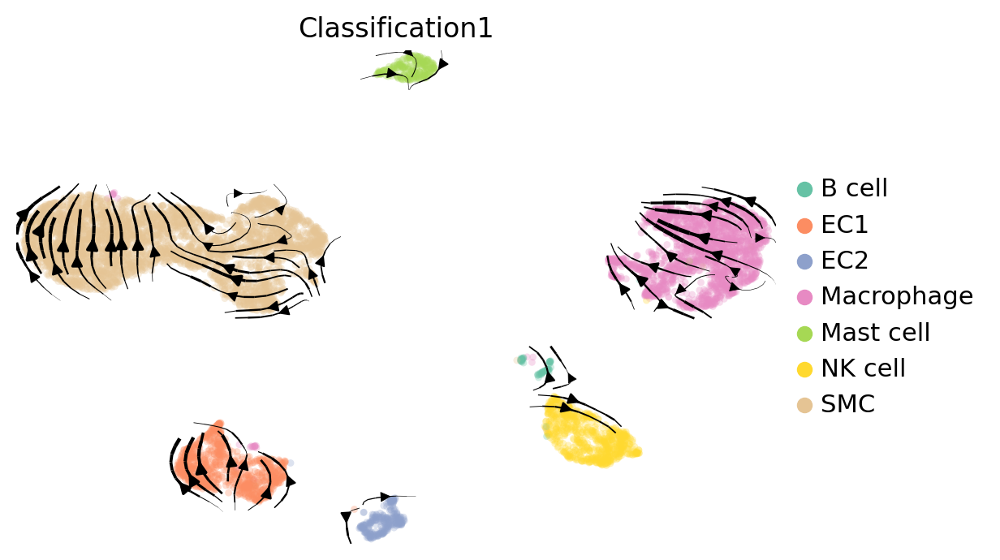

In [8]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['initial_size_spliced'], legend_loc='right margin', size=40, show = False)
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['Classification1'], legend_loc='right margin', size=40, show = False)

### markers
静脉

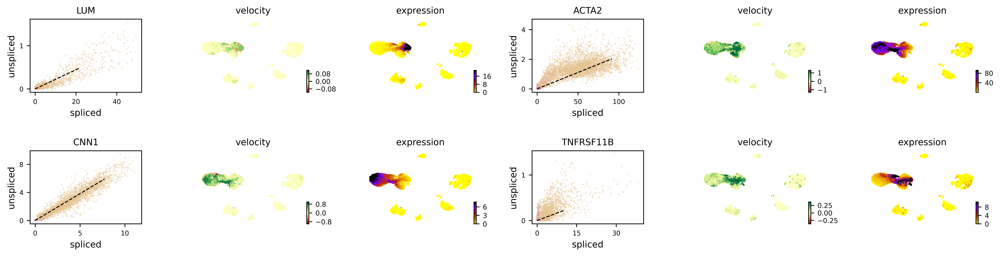

In [9]:
var_names = ["LUM", "ACTA2", "CNN1", "TNFRSF11B"]
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2, color=['Classification1'], palette = colorlist, dpi=300)

动脉

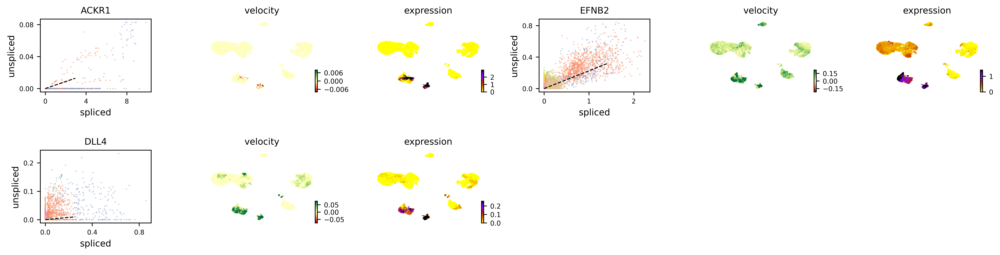

In [10]:
var_names = ["ACKR1", "EFNB2", "NOTCH4", "DLL4"]
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2, color=['Classification1'], palette = colorlist, dpi=300)

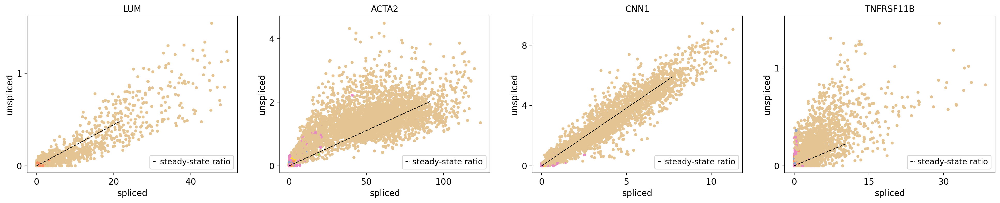

In [11]:
scv.pl.scatter(adata,color=['Classification1'], basis=["LUM", "ACTA2", "CNN1", "TNFRSF11B"], ncols=4, frameon=True, palette = colorlist, size=70)

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


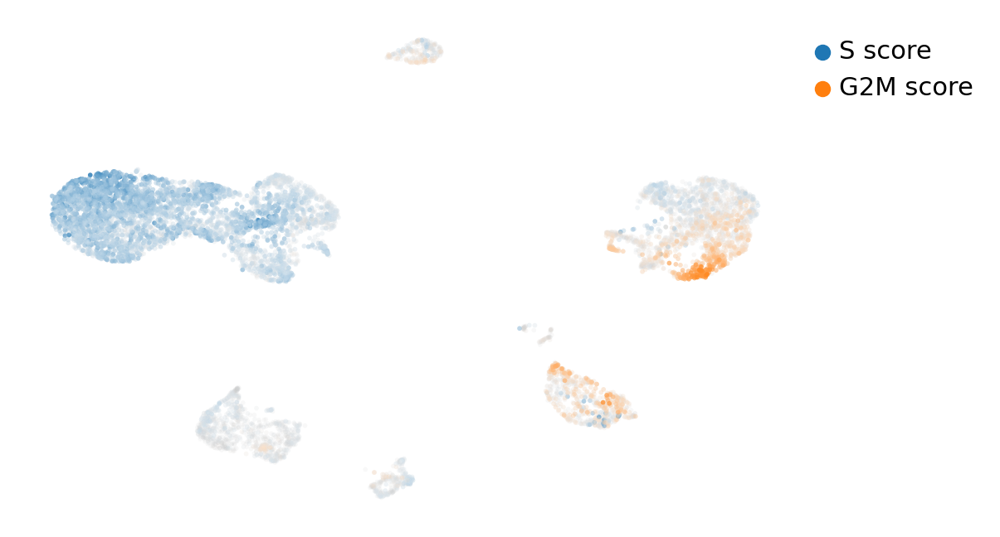

In [12]:
scv.tl.score_genes_cell_cycle(adata) 
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
computing terminal states
    identified 4 regions of root cells and 5 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


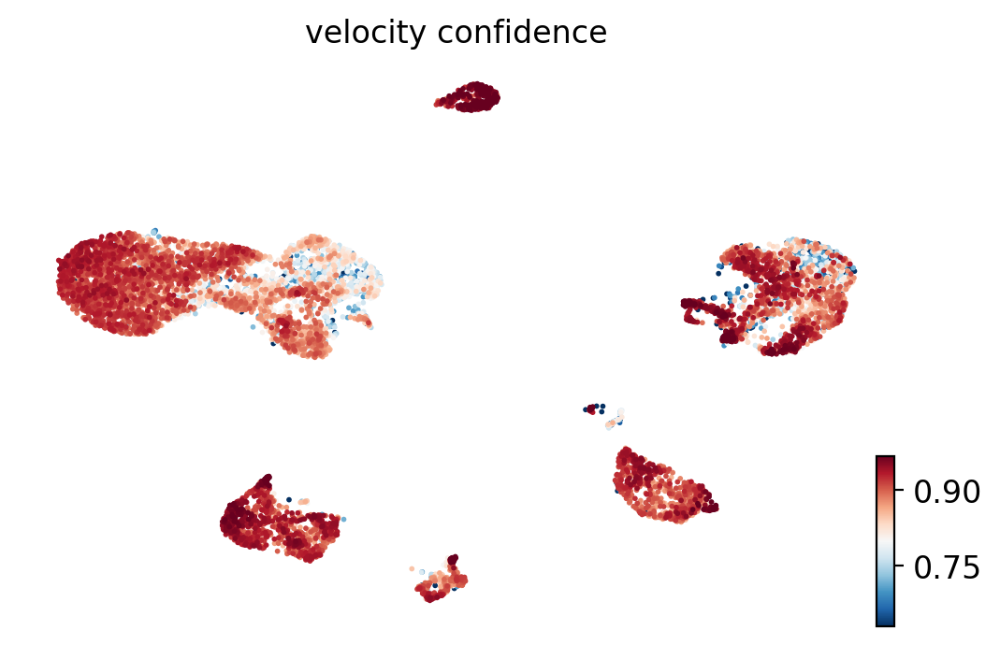

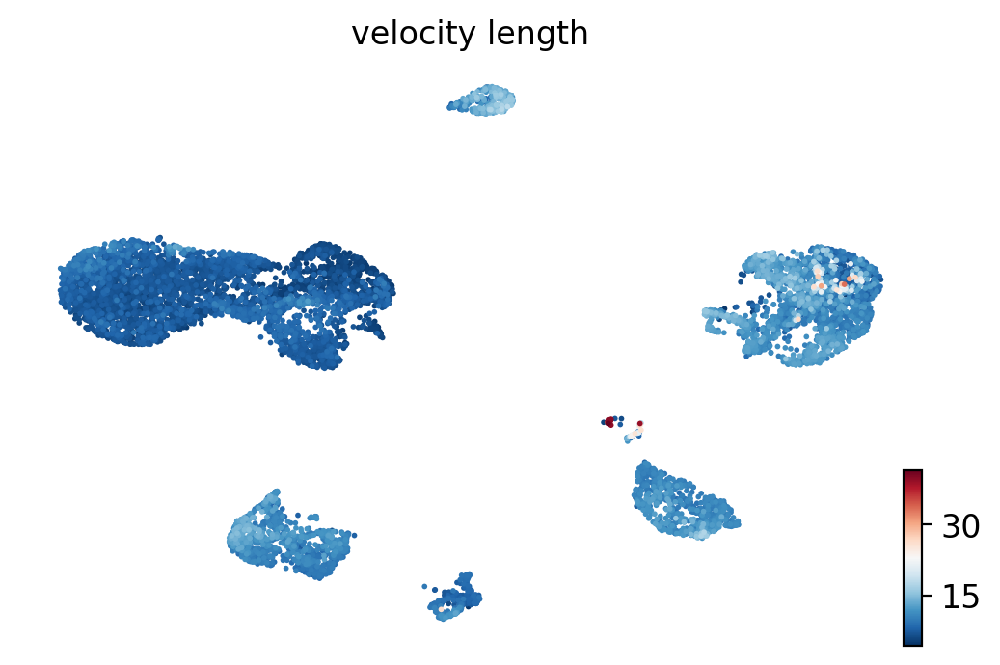

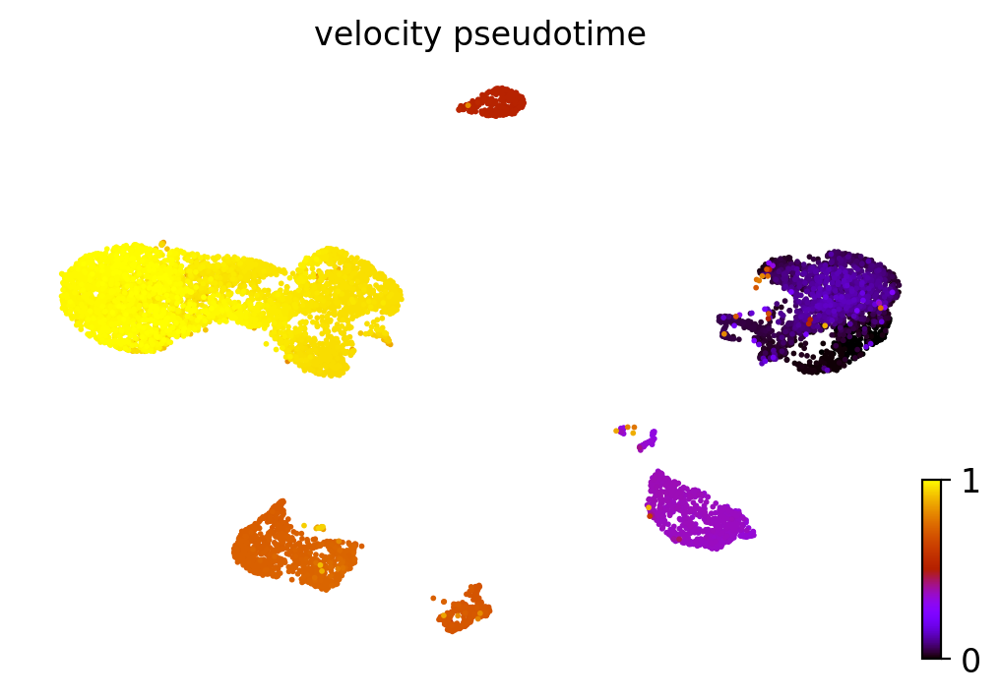

In [13]:
scv.tl.velocity_confidence(adata)
scv.tl.velocity_pseudotime(adata)

scv.pl.scatter(adata, color='velocity_confidence', perc=[2,98])
scv.pl.scatter(adata, color='velocity_length')
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')


In [14]:
scv.tl.recover_dynamics(adata, n_jobs=6)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata, n_jobs=6)

recovering dynamics (using 6/8 cores)


  0%|          | 0/1702 [00:00<?, ?gene/s]

    finished (0:06:25) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:24) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 6/8 cores)


  0%|          | 0/8693 [00:00<?, ?cells/s]

    finished (0:00:12) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing latent time using root_cells as prior
    finished (0:00:04) --> added 
    'latent_time', shared time (adata.obs)
computing velocity clusters
    finished (0:00:00) --> added 
    'velocity_clusters', clusters based on louvain modularity on velocity vector field (adata.obs)
ranking velocity genes
    finished (0:00:04) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


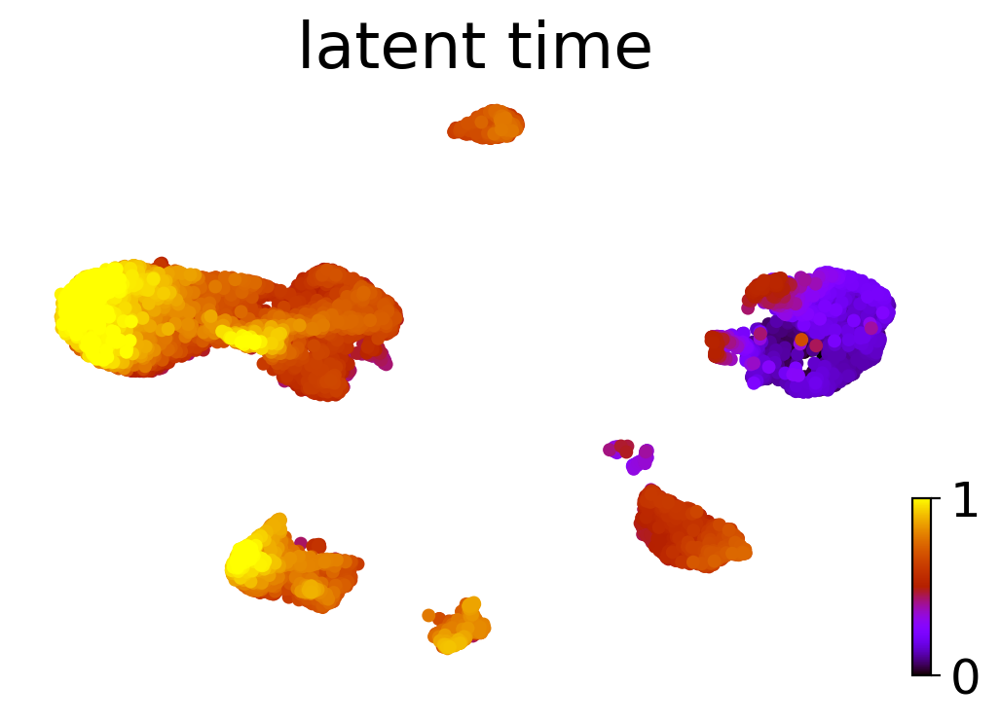

In [15]:
scv.tl.latent_time(adata)
scv.tl.rank_velocity_genes(adata, match_with='Classification1', resolution=.4)

scv.pl.scatter(adata, color='latent_time', fontsize=24, size=100,
               color_map='gnuplot', perc=[2, 98], colorbar=True, rescale_color=[0,1])


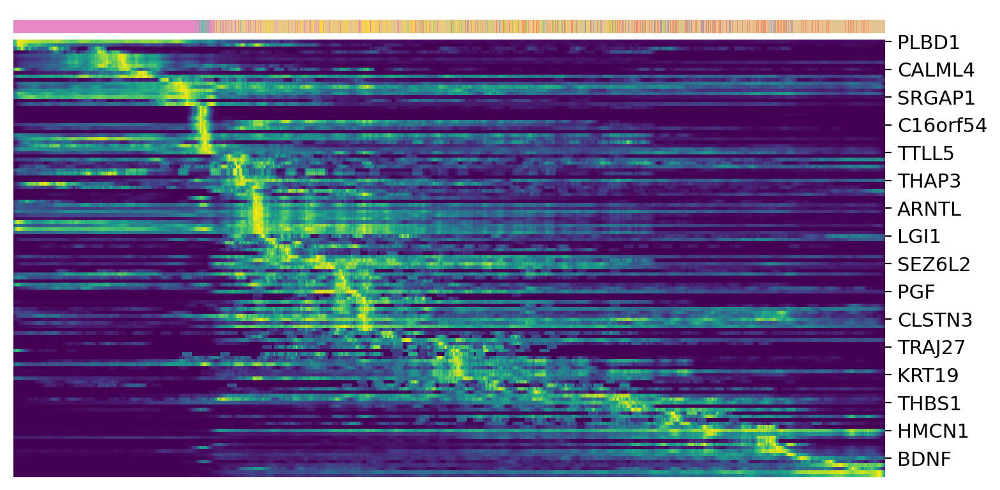

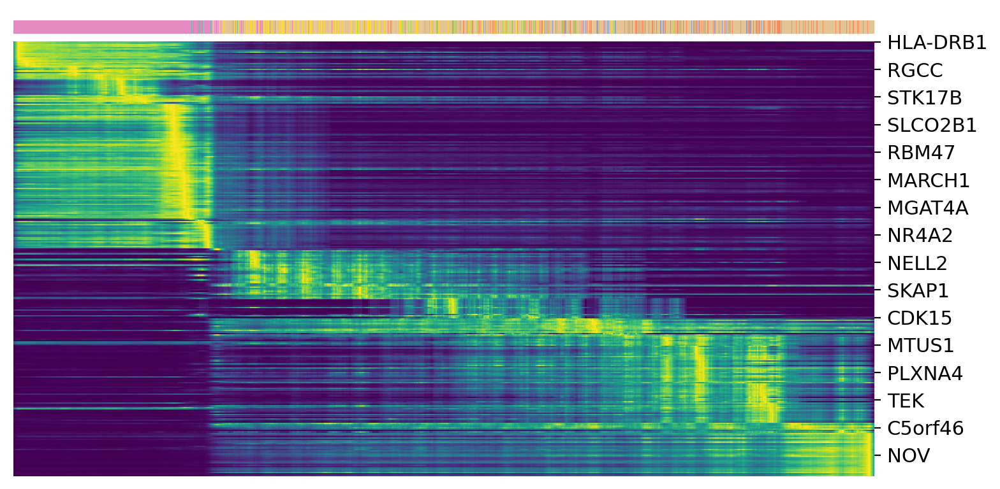

In [16]:
top_genes = np.unique(adata.var_names[adata.var.fit_likelihood.argsort()[::-1]][:300])
scv.pl.heatmap(adata, var_names=top_genes, tkey='latent_time', n_convolve=100, col_color='Classification1')
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='Classification1', n_convolve=100)

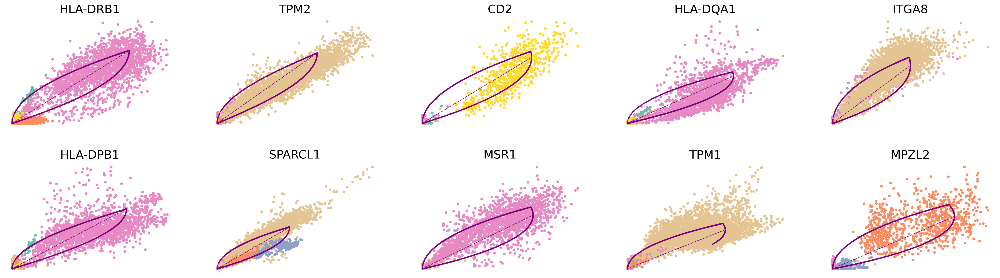

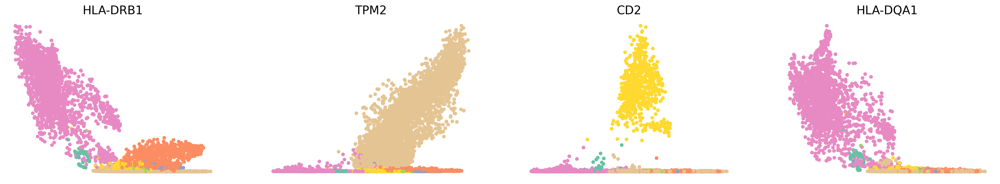

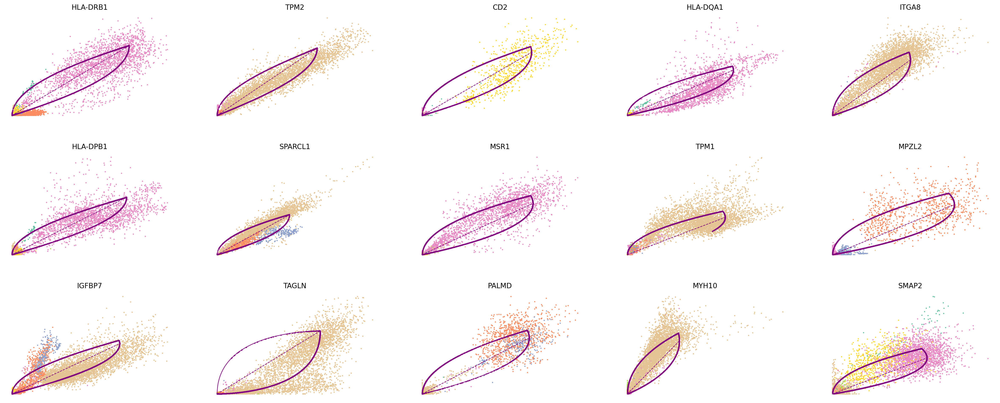

In [17]:
scv.pl.scatter(adata, basis=top_genes[:10], legend_loc='none',
               size=80, frameon=False, ncols=5, fontsize=20,color='Classification1')
scv.pl.scatter(adata, x='latent_time', y=top_genes[:4], fontsize=16, size=100,
               n_convolve=None, frameon=False, legend_loc='none',color='Classification1')
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False, color='Classification1')



In [18]:
var_names = ["LUM", "ACTA2", "CNN1", "TNFRSF11B"]
scv.tl.differential_kinetic_test(adata, var_names=var_names, groupby='Classification1')
scv.get_df(adata[:, var_names], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)

testing for differential kinetics
    finished (0:00:00) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)

outputs model fit of gene: TNFRSF11B


,fit_diff_kinetics,fit_pval_kinetics
CNN1,SMC,2.95e-08
TNFRSF11B,SMC,9.92e-21


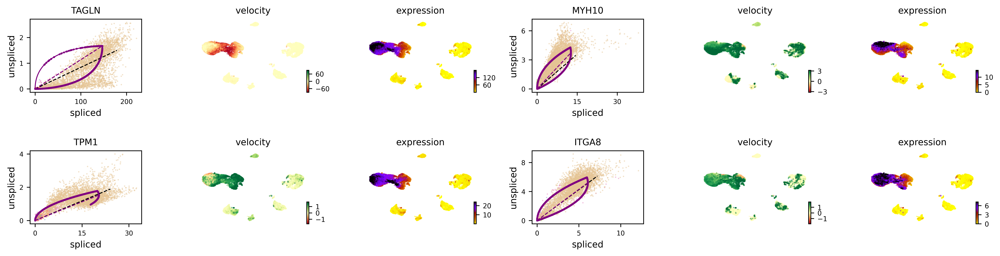

In [20]:
var_names = ["TAGLN", "MYH10", "TPM1", "ITGA8"]
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2, color=['Classification1'], palette = colorlist, dpi=300)